# Step 2: Data Cleaning & Preprocessing

In [111]:
# This code is for Step 2 of the project as described in the README.md
import pandas as pd
import numpy as np
from datetime import datetime

# Read the CSV file
df = pd.read_csv('youtube_data/all_videos_data.csv')
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9882 entries, 0 to 9881
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   keyword           9882 non-null   object 
 1   category          9882 non-null   object 
 2   video_id          9882 non-null   object 
 3   title             9882 non-null   object 
 4   published_date    9882 non-null   object 
 5   duration_seconds  9882 non-null   float64
 6   view_count        9882 non-null   int64  
 7   like_count        9882 non-null   int64  
 8   comment_count     9882 non-null   int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 695.0+ KB


,duration_seconds,view_count,like_count,comment_count
count,9882.000000,9.882000e+03,9.882000e+03,9882.000000
mean,2040.937766,2.499430e+05,5.272728e+03,68.054948
std,2151.297658,3.421599e+06,7.275100e+04,817.271534
min,5.000000,0.000000e+00,0.000000e+00,0.000000
25%,432.000000,2.180000e+02,3.000000e+00,0.000000
50%,1554.000000,6.805000e+02,1.100000e+01,0.000000
75%,3115.000000,2.839500e+03,5.300000e+01,3.000000
max,42900.000000,1.171547e+08,2.272608e+06,43414.000000


In [ ]:
# 1. Remove duplicates
df = df.drop_duplicates()

# 2. Convert published_date to datetime
df['published_date'] = pd.to_datetime(df['published_date'].str.replace('Z', ''))

# 3. Convert numeric columns to appropriate types
numeric_columns = ['duration_seconds', 'view_count', 'like_count', 'comment_count']
for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# 4. Add human-readable duration column
df['duration_formatted'] = pd.to_datetime(df['duration_seconds'], unit='s').dt.strftime('%H:%M:%S')

# 5. Clean titles (remove extra whitespace and special characters if needed)
df['title'] = df['title'].str.strip()

# 6. Create engagement metrics & round to 2 decimal places
# As inspired from the article: https://www.storyly.io/post/how-to-calculate-engagement-rate
df['engagement_rate'] = (((df['like_count'] + df['comment_count']) / df['view_count']) * 100).round(2)

# 7. Drop rows with all missing values
df = df.dropna(how='all')

# 8. Sort by keyword and category
df = df.sort_values(['category','keyword'], ascending=False)

# Save the cleaned dataset
df.to_csv('youtube_data/cleaned_videos_data.csv', index=False)

# Step 3: Solution for the problem of Irrelevant Videos

Create a relevance scoring system for the videos based on their titles and the searched keywords:

- Creates a calculate_relevance_score function that uses three metrics:
  - Direct keyword presence (30% weight)
  - Word overlap score (40% weight)
  - Sequence similarity (30% weight)
- Calculates a relevance score (0-100) for each video
  - Adds a relevance category (High/Medium/Low/Not Relevant)
  - Filter out irrelevant videos

In [4]:
# This code is for Step 3 of the project as described in the README.md
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
import nltk
from difflib import SequenceMatcher
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# Download required NLTK data
nltk.download('punkt')

# Initialize BERT model
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

def calculate_base_score(title, keyword):
    """
    Calculate basic relevance score between video title and search keyword
    using multiple metrics
    """
    title = str(title).lower()
    keyword = str(keyword).lower()
    
    # 1. Direct keyword presence (30% weight)
    keyword_present = 1 if keyword in title else 0
    
    # 2. Word overlap score (40% weight)
    title_words = set(word_tokenize(title))
    keyword_words = set(word_tokenize(keyword))
    overlap_score = len(title_words.intersection(keyword_words)) / len(keyword_words) if keyword_words else 0
    
    # 3. Sequence similarity (30% weight)
    sequence_score = SequenceMatcher(None, title, keyword).ratio()
    
    # Combine scores with weights
    final_score = (0.3 * keyword_present + 
                  0.4 * overlap_score + 
                  0.3 * sequence_score) * 100
    
    return round(final_score, 2)

def calculate_relevance_score(row, model=model):
    """
    Enhanced version with semantic similarity using BERT
    """
    title = str(row['title']).lower()
    keyword = str(row['keyword']).lower()
    
    # Get embeddings
    title_embedding = model.encode([title])
    keyword_embedding = model.encode([keyword])
    
    # Calculate semantic similarity
    semantic_score = cosine_similarity(title_embedding, keyword_embedding)[0][0]
    
    # Calculate base score
    base_score = calculate_base_score(title, keyword)
    
    # Combined score (60% base score, 40% semantic similarity)
    final_score = (0.6 * base_score + 0.4 * semantic_score * 100)
    
    return round(final_score, 2)

def main():
    # Read the cleaned dataset
    df = pd.read_csv('youtube_data/cleaned_videos_data.csv')
    
    # Calculate relevance scores
    df['relevance_score'] = df.apply(calculate_relevance_score, axis=1)
    
    # Add relevance category
    def get_relevance_category(score):
        if score >= 45:
            return 'High'
        elif score >= 25:
            return 'Medium'
        elif score >= 10:
            return 'Low'
        else:
            return 'Not Relevant'
    
    df['relevance_category'] = df['relevance_score'].apply(get_relevance_category)
    
    # Filter out irrelevant videos
    df_relevant = df[df['relevance_score'] > 10]
    
    # Save the updated dataset
    df.to_csv('youtube_data/videos_with_relevance.csv', index=False)
    
    # Print Results Summary
    print("\nRelevance Analysis Results:")
    print("-" * 100)
    
    # Overall statistics
    print("\nOverall Statistics:")
    print(f"Total videos analyzed: {len(df)}")
    print(f"Average relevance score: {df['relevance_score'].mean():.2f}")
    print(f"Median relevance score: {df['relevance_score'].median():.2f}")
    print(f"Score range: {df['relevance_score'].min():.2f} - {df['relevance_score'].max():.2f}")
    
    # Category distribution
    print("\nRelevance Category Distribution:")
    category_counts = df['relevance_category'].value_counts()
    for category, count in category_counts.items():
        percentage = (count / len(df)) * 100
        print(f"{category}: {count} videos ({percentage:.1f}%)")
    
    # Top performing keywords
    print("\nTop 5 Keywords by Average Relevance Score:")
    keyword_performance = df.groupby('keyword')['relevance_score'].agg(['mean', 'count'])
    keyword_performance = keyword_performance[keyword_performance['count'] >= 5]  # Filter for keywords with at least 5 videos
    top_keywords = keyword_performance.sort_values('mean', ascending=False).head()
    print(top_keywords)
    
    # Category-wise analysis
    print("\nCategory-wise Relevance Scores:")
    category_stats = df.groupby('category')['relevance_score'].agg(['mean', 'median', 'count'])
    print(category_stats)
    
    return df

if __name__ == "__main__":
    df = main()

# This would take at 5 to 10 minutes to complete the process.

[nltk_data] Downloading package punkt to /Users/neon/nltk_data...
[nltk_data]   Package punkt is already up-to-date!



Relevance Analysis Results:
--------------------------------------------------

Overall Statistics:
Total videos analyzed: 9882
Average relevance score: 36.75
Median relevance score: 37.21
Score range: -1.48 - 100.00

Relevance Category Distribution:
Medium: 5762 videos (58.3%)
High: 2474 videos (25.0%)
Low: 1498 videos (15.2%)
Not Relevant: 148 videos (1.5%)

Top 5 Keywords by Average Relevance Score:
                                                      mean  count
keyword                                                          
Breeding for disease resistance in plant breeding  62.4998     50
Mass selection in plant breeding                   53.7518     50
Clonal selection in plant breeding                 49.7058     50
Germplasm conservation in plant breeding           49.2498     50
Pedigree breeding in plant breeding                48.2128     50

Category-wise Relevance Scores:
               mean  median  count
category                          
Current   37.700767  38.395 

# Step 4: Exploratory Data Analysis

Here, I am analysing the broder trends related to plant breeding videos from 2008 to 2023 (15 years). First loading and preprocessing a CSV file containing video metadata, as per the categories (Modern, Current, and Old) with associated keywords. The visualization combines a stacked bar chart showing video counts per category over time with an overlaid line graph of engagement rates. The analysis process involves: 
1) filtering relevant data and establishing color schemes for each category, 
2) calculating yearly statistics including video counts and engagement metrics, 
3) identifying top keywords for each category based on view counts, 
4) creating an interactive visualization using Plotly that displays both the distribution of content categories and engagement trends, 
5) generating summary statistics to provide insights into overall performance metrics and keyword popularity. 

So this approach allows to understand both the temporal evolution of plant breeding content on YouTube and the relative success of different content categories and keywords.

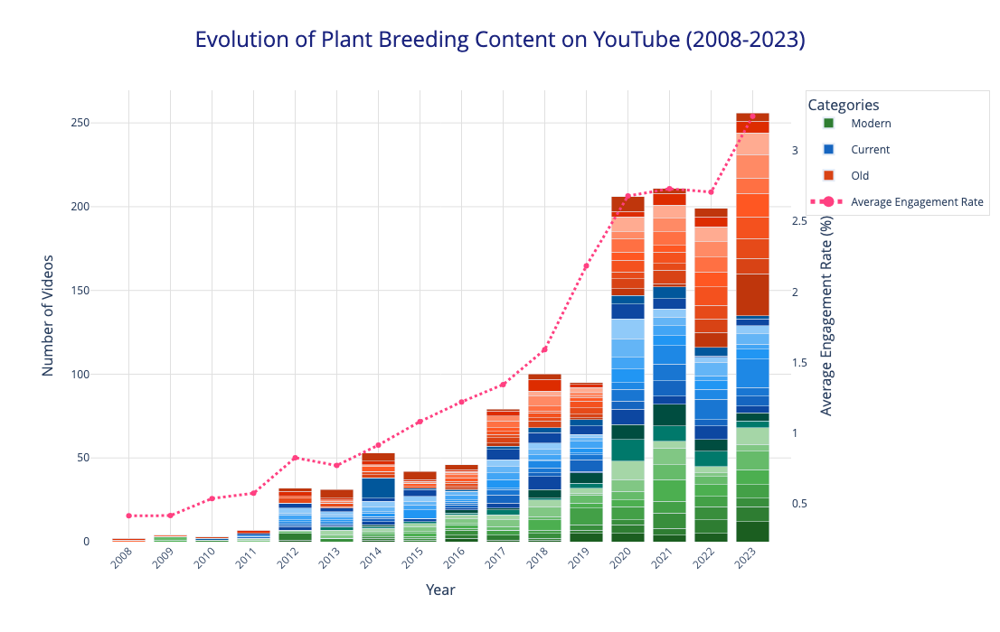


Top 10 Keywords Overall (by videos and engagement):
--------------------------------------------------
1. Propagation techniques in plant breeding (Old):
   Total Views: 327,306,877.0
   Avg Views: 7,438,793
   Avg Engagement Rate: 1.92%
2. Indigenous breeding methods in plant breeding (Old):
   Total Views: 165,438,677.0
   Avg Views: 3,676,415
   Avg Engagement Rate: 2.12%
3. Historical agronomic practices in plant breeding (Old):
   Total Views: 163,693,702.0
   Avg Views: 3,558,559
   Avg Engagement Rate: 2.93%
4. Hybridization techniques in plant breeding (Old):
   Total Views: 158,570,248.0
   Avg Views: 3,303,547
   Avg Engagement Rate: 2.81%
5. Controlled hybrid seed production in plant breeding (Current):
   Total Views: 122,766,615.0
   Avg Views: 2,668,839
   Avg Engagement Rate: 1.93%
6. Geographic adaptation in plant breeding (Old):
   Total Views: 104,183,031.0
   Avg Views: 2,315,178
   Avg Engagement Rate: 1.98%
7. Cross-pollination techniques in plant breeding (Old):


In [7]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np
from datetime import datetime

# Read the data
df = pd.read_csv('youtube_data/videos_with_relevance.csv')
df['published_date'] = pd.to_datetime(df['published_date'])

# Filter data from 2008 to 2023
df_filtered = df[
    (df['published_date'].dt.year >= 2008) & 
    (df['published_date'].dt.year < 2024) &
    (df['relevance_category'] != 'Not Relevant')
]

# Decided to use color palettes with 10 shades for each category
modern_colors = [
    '#1B5E20', '#2E7D32', '#388E3C', '#43A047',  # Deep greens
    '#4CAF50', '#66BB6A', '#81C784', '#A5D6A7',  # Lighter greens
    '#00796B', '#004D40'                         # Deep teal/green accents
]

current_colors = [
    '#0D47A1', '#1565C0', '#1976D2', '#1E88E5',  # Deep blues
    '#2196F3', '#42A5F5', '#64B5F6', '#90CAF9',  # Lighter blues
    '#0D47A1', '#01579B'                         # Navy/steel blue accents
]


old_colors = [
    '#BF360C', '#D84315', '#E64A19', '#F4511E',  # Deep oranges
    '#FF5722', '#FF7043', '#FF8A65', '#FFAB91',  # Soft oranges
    '#DD2C00', '#BF360C'                         # Deep red/orange accents
]


def get_top_keywords(data, category):
    """Get top 10 keywords for a category based on view count"""
    return (data[data['category'] == category]
            .groupby('keyword')['view_count']
            .sum()
            .nlargest(10)
            .index
            .tolist())

# Create yearly statistics with keyword breakdown
yearly_stats = []
for year in df_filtered['published_date'].dt.year.unique():
    year_data = df_filtered[df_filtered['published_date'].dt.year == year]
    
    stats = {
        'year': year,
        'videoCount': len(year_data),
        'avgEngagement': year_data['engagement_rate'].mean(),
        'avgViews': year_data['view_count'].mean(),
        'totalViews': year_data['view_count'].sum()
    }
    
    # Add counts for top keywords in each category
    for category, colors in [('Modern', modern_colors), 
                           ('Current', current_colors), 
                           ('Old', old_colors)]:
        top_keywords = get_top_keywords(df_filtered, category)
        for keyword, color in zip(top_keywords, colors):
            stats[f"{category}_{keyword}"] = len(
                year_data[(year_data['category'] == category) & 
                         (year_data['keyword'] == keyword)]
            )
    
    yearly_stats.append(stats)

yearly_df = pd.DataFrame(yearly_stats).sort_values('year')

# Create the interactive visualization with simplified legend
fig = go.Figure()

# Add stacked bars for each category's keywords
for category, colors in [('Modern', modern_colors), 
                         ('Current', current_colors), 
                         ('Old', old_colors)]:
    top_keywords = get_top_keywords(df_filtered, category)
    for keyword, color in zip(top_keywords, colors):
        fig.add_trace(go.Bar(
            x=yearly_df['year'],
            y=yearly_df[f"{category}_{keyword}"],
            name=f"{category}",
            marker_color=color,
            legendgroup=category,
            showlegend=(keyword == top_keywords[1]),
            hoverinfo="skip"
        ))
        
# Add engagement rate line
fig.add_trace(go.Scatter(
    x=yearly_df['year'],
    y=yearly_df['avgEngagement'],
    name='Average Engagement Rate',
    yaxis='y2',
    line=dict(color='#FF4081', width=3, dash='dot'),
    hovertemplate="Year: %{x}<br>Engagement Rate: %{y:.2f}%<extra></extra>"
))

# Update layout with simplified legend
fig.update_layout(
    title={
        'text': 'Evolution of Plant Breeding Content on YouTube (2008-2023)',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24, 'color': '#1A237E'}
    },
    barmode='stack',
    plot_bgcolor='white',
    paper_bgcolor='white',
    width=1100,
    height=700,
    showlegend=True,
    legend={
        'title': {'text': 'Categories', 'font': {'size': 16}},
        'bgcolor': 'rgba(255, 255, 255, 0.8)',
        'bordercolor': '#E0E0E0',
        'borderwidth': 1,
        'itemsizing': 'constant',
        'itemwidth': 40,
        'x': 1.02,
        'y': 1,
        'font': {'size': 12}
    },
    hovermode='x unified',
    xaxis={
        'title': {'text': 'Year', 'font': {'size': 16}},
        'gridcolor': '#E0E0E0',
        'showgrid': True,
        'range': [2008, 2023],
        'dtick': 1,
        'tickangle': -45
    },
    yaxis={
        'title': {'text': 'Number of Videos', 'font': {'size': 16}},
        'gridcolor': '#E0E0E0',
        'showgrid': True,
        'zeroline': False
    },
    yaxis2={
        'title': {'text': 'Average Engagement Rate (%)', 'font': {'size': 16}},
        'overlaying': 'y',
        'side': 'right',
        'showgrid': False,
        'zeroline': False
    },
    margin={'t': 100, 'b': 100, 'l': 100, 'r': 100}
)

# Show the interactive plot
fig.show()

# Print summary statistics by highest number of views and highest engagement rate
print("\nTop 10 Keywords Overall (by videos and engagement):")
print("-" * 50)
overall_top_keywords = (df_filtered.groupby('keyword')
                       .agg({
                           'view_count': ['sum', 'mean'],
                           'engagement_rate': 'mean'
                       })
                       .sort_values([('view_count', 'sum'), ('engagement_rate', 'mean')], 
                                  ascending=[False, False]))

for idx, (keyword, stats) in enumerate(overall_top_keywords.head(10).iterrows(), 1):
    category = df_filtered[df_filtered['keyword'] == keyword]['category'].iloc[0]
    print(f"{idx}. {keyword} ({category}):")
    print(f"   Total Views: {stats[('view_count', 'sum')]:,}")
    print(f"   Avg Views: {stats[('view_count', 'mean')]:,.0f}")
    print(f"   Avg Engagement Rate: {stats[('engagement_rate', 'mean')]:.2f}%")

# Category-wise Top 10 keywords
for category in ['Modern', 'Current', 'Old']:
    print(f"\n{category} Category Top Keywords (by views and engagement):")
    print("-" * 50)
    category_keywords = (df_filtered[df_filtered['category'] == category]
                        .groupby('keyword')
                        .agg({
                            'view_count': ['sum', 'mean'],
                            'engagement_rate': 'mean'
                        })
                        .sort_values([('view_count', 'sum'), ('engagement_rate', 'mean')], 
                                   ascending=[False, False]))
    
    for idx, (keyword, stats) in enumerate(category_keywords.head(10).iterrows(), 1):
        print(f"{idx}. {keyword}:")
        print(f"   Total Views: {stats[('view_count', 'sum')]:,}")
        print(f"   Avg Views: {stats[('view_count', 'mean')]:,.0f}")
        print(f"   Avg Engagement Rate: {stats[('engagement_rate', 'mean')]:.2f}%")

## Engagement Analysis

In this part we try to constructs four violin plots using Plotly Express to visualize the distribution of key metrics across different categories (Modern, Current, and Old) in plant breeding videos. 

The plots show: 

(1) Engagement Rate Distribution, displaying raw engagement percentages, 

(2) View Count Distribution, using log-transformed data to handle large variations in views, 

(3) Like Count Distribution, also log-transformed for better visualization, and
 
(4) Comment Count Distribution, similarly log-transformed. 

Each violin plot includes box plots within them to show quartiles, and individual data points are overlaid for detailed examination. The plots are enhanced with comprehensive hover information showing the original values, video titles, and engagement rates, and use a consistent color scheme (green for Modern, blue for Current, and orange for Old categories). Finally, we print the detailed statistical summaries for each metric, showing median, mean, standard deviation, range, and various percentiles for each category.

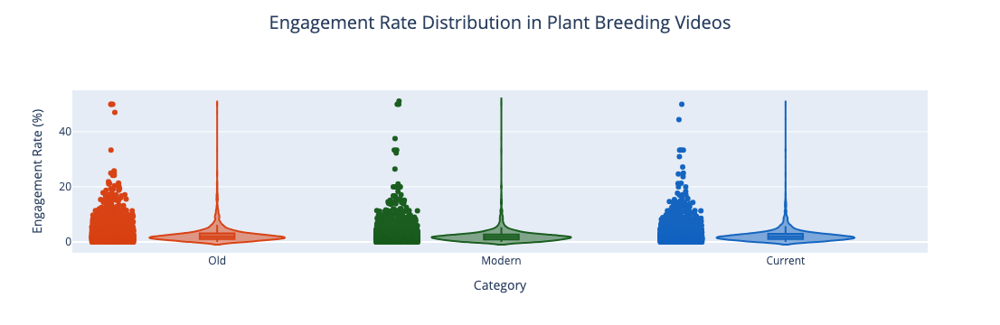

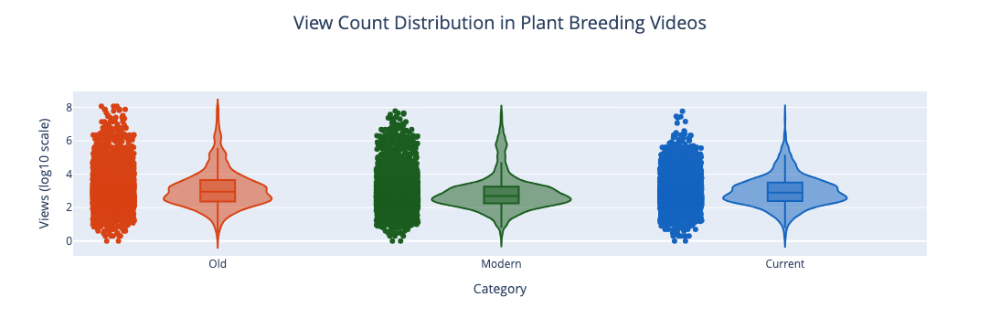

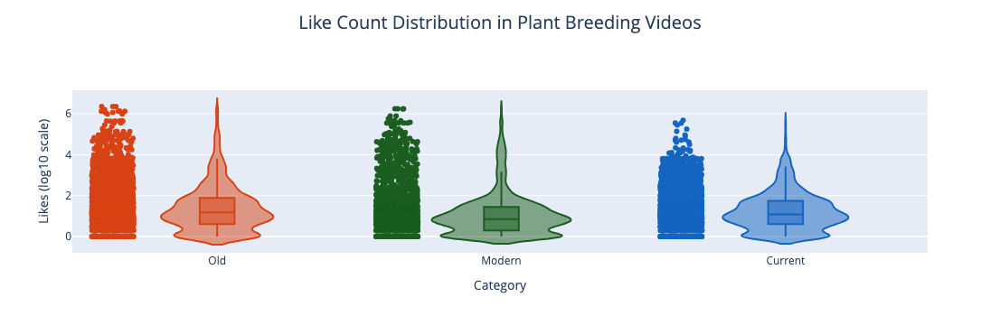

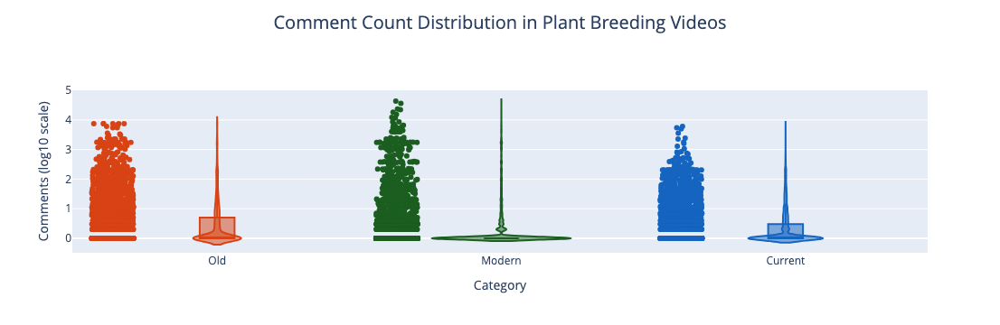


Detailed Statistics by Category:

Old Category:
----------------------------------------

Views:
  Median: 909.50
  Mean: 476,292.65
  Std Dev: 5,335,005.97
  Range: 0.00 - 117,154,689.00
  Percentiles:
    25th: 234.00
    50th: 909.50
    75th: 4,472.75
    90th: 44,768.80
    95th: 196,847.35

Likes:
  Median: 15.00
  Mean: 9,181.28
  Std Dev: 103,450.90
  Range: 0.00 - 2,272,608.00
  Percentiles:
    25th: 4.00
    50th: 15.00
    75th: 77.00
    90th: 841.50
    95th: 4,631.70

Comments:
  Median: 0.00
  Mean: 63.14
  Std Dev: 457.21
  Range: 0.00 - 7,544.00
  Percentiles:
    25th: 0.00
    50th: 0.00
    75th: 5.00
    90th: 32.00
    95th: 148.05

Engagement Rate:
  Median: 1.84
  Mean: 2.66
  Std Dev: 3.28
  Range: 0.00 - 50.00
  Percentiles:
    25th: nan
    50th: nan
    75th: nan
    90th: nan
    95th: nan

Modern Category:
----------------------------------------

Views:
  Median: 487.50
  Mean: 200,511.95
  Std Dev: 2,168,565.05
  Range: 0.00 - 60,957,725.00
  Percenti

In [30]:
import plotly.express as px
import numpy as np
import pandas as pd

# Color scheme
colors = {
    'Modern': '#1B5E20',
    'Current': '#1565C0',
    'Old': '#D84315'
}

# 1. Engagement Rate Violin Plot
fig_engagement = px.violin(
    df,
    y="engagement_rate",
    x="category",
    color="category",
    box=True,
    points="all",
    hover_data=['title', 'view_count', 'like_count', 'comment_count'],
    title="Engagement Rate Distribution by Category",
    color_discrete_map=colors
)

fig_engagement.update_layout(
    title={
        'text': 'Engagement Rate Distribution in Plant Breeding Videos',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 20}
    },
    xaxis_title="Category",
    yaxis_title="Engagement Rate (%)",
    height=600,
    showlegend=False
)

# Function to normalize data for better visualization
def normalize_for_violin(series):
    """Normalize data using log transformation and handling zeros"""
    min_non_zero = series[series > 0].min()
    return np.log10(series.clip(lower=min_non_zero))

# Create copy of dataframe with normalized values
df_normalized = df.copy()
df_normalized['view_count_norm'] = normalize_for_violin(df['view_count'])
df_normalized['like_count_norm'] = normalize_for_violin(df['like_count'])
df_normalized['comment_count_norm'] = normalize_for_violin(df['comment_count'])

# 2. Views Violin Plot
fig_views = px.violin(
    df_normalized,
    y="view_count_norm",
    x="category",
    color="category",
    box=True,
    points="all",
    hover_data={
        'view_count_norm': False,
        'view_count': ':,',
        'title': True,
        'engagement_rate': ':.2f'
    },
    title="View Count Distribution by Category",
    color_discrete_map=colors
)

fig_views.update_layout(
    title={
        'text': 'View Count Distribution in Plant Breeding Videos',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 20}
    },
    xaxis_title="Category",
    yaxis_title="Views (log10 scale)",
    height=600,
    showlegend=False
)

# Add original value labels to hover
fig_views.update_traces(
    hovertemplate="<br>".join([
        "Category: %{x}",
        "Views: %{customdata[1]:,}",
        "Title: %{customdata[2]}",
        "Engagement: %{customdata[3]:.2f}%"
    ])
)

# 3. Likes Violin Plot
fig_likes = px.violin(
    df_normalized,
    y="like_count_norm",
    x="category",
    color="category",
    box=True,
    points="all",
    hover_data={
        'like_count_norm': False,
        'like_count': ':,',
        'title': True,
        'engagement_rate': ':.2f'
    },
    title="Like Count Distribution by Category",
    color_discrete_map=colors
)

fig_likes.update_layout(
    title={
        'text': 'Like Count Distribution in Plant Breeding Videos',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 20}
    },
    xaxis_title="Category",
    yaxis_title="Likes (log10 scale)",
    height=600,
    showlegend=False
)

# 4. Comments Violin Plot
fig_comments = px.violin(
    df_normalized,
    y="comment_count_norm",
    x="category",
    color="category",
    box=True,
    points="all",
    hover_data={
        'comment_count_norm': False,
        'comment_count': ':,',
        'title': True,
        'engagement_rate': ':.2f'
    },
    title="Comment Count Distribution by Category",
    color_discrete_map=colors
)

fig_comments.update_layout(
    title={
        'text': 'Comment Count Distribution in Plant Breeding Videos',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 20}
    },
    xaxis_title="Category",
    yaxis_title="Comments (log10 scale)",
    height=600,
    showlegend=False
)

# Display all plots
fig_engagement.show()
fig_views.show()
fig_likes.show()
fig_comments.show()

# Print statistics
print("\nDetailed Statistics by Category:")
print("=" * 80)

for category in df['category'].unique():
    print(f"\n{category} Category:")
    print("-" * 40)
    cat_data = df[df['category'] == category]
    
    metrics = {
        'Views': 'view_count',
        'Likes': 'like_count',
        'Comments': 'comment_count',
        'Engagement Rate': 'engagement_rate'
    }
    
    for metric_name, column in metrics.items():
        data = cat_data[column]
        print(f"\n{metric_name}:")
        print(f"  Median: {data.median():,.2f}")
        print(f"  Mean: {data.mean():,.2f}")
        print(f"  Std Dev: {data.std():,.2f}")
        print(f"  Range: {data.min():,.2f} - {data.max():,.2f}")
        
        # Calculate percentiles
        percentiles = [25, 50, 75, 90, 95]
        print("  Percentiles:")
        for p in percentiles:
            print(f"    {p}th: {np.percentile(data, p):,.2f}")


## Publishing Time Analysis:

In this part of analysis, we are trying to find out the optimal publishing time for the videos. We are using four different plots arranged in a 2x2 grid using Plotly's subplot functionality. The analysis examines how videos perform based on when they're published, using variables extracted from the 'published_date' column (hour, day, and month). The visualization includes: 

(1) a heatmap showing engagement rates by day and hour using a red-yellow-green color scheme, 

(2) another heatmap displaying average views by day and hour using a Viridis color scheme, 

(3) a third heatmap showing the publishing volume (number of videos) by day and hour using a blue color scheme, 

(4) a bar chart showing daily engagement metrics across different days of the week. 

And finally, print the detailed insights about the best publishing days, optimal hours, peak performance time slots, and least competitive time slots based on engagement rates and view counts. All these visualizations help identify patterns in video performance based on publishing timing.

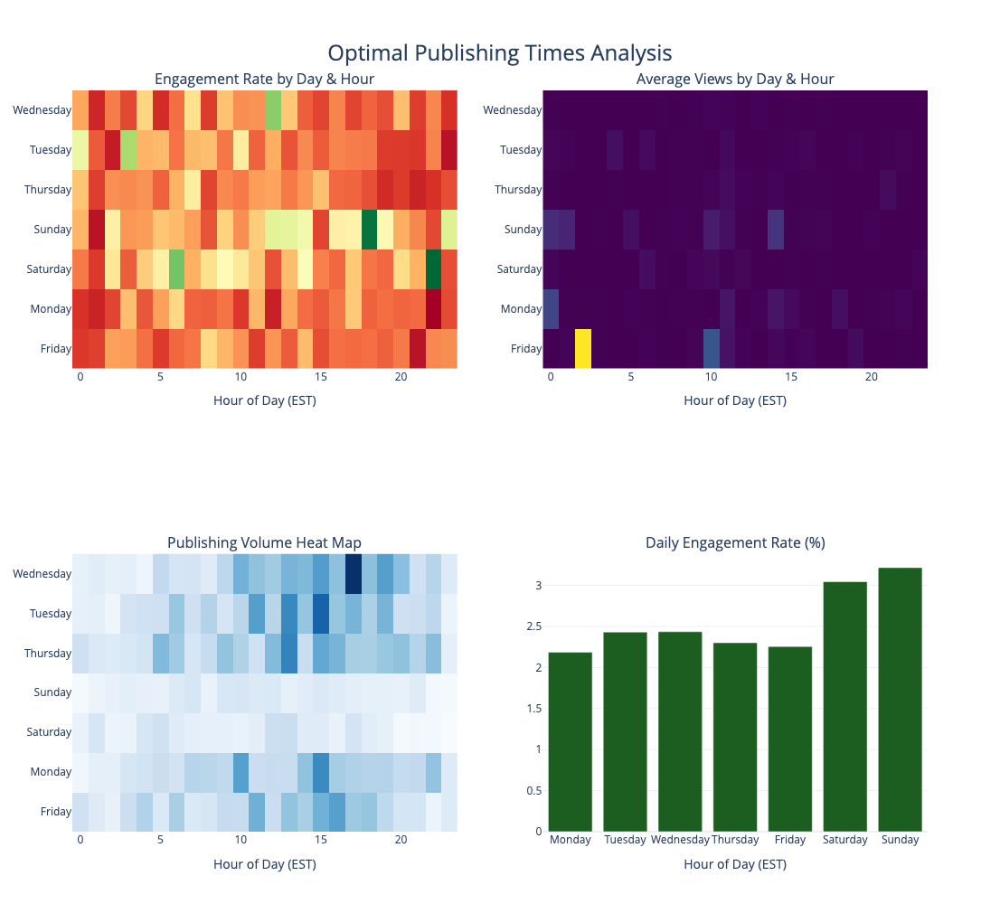


Optimal Publishing Time Analysis:

Best Publishing Days (by Engagement Rate):
- Sunday: 3.22% engagement rate
- Saturday: 3.05% engagement rate
- Wednesday: 2.44% engagement rate

Best Publishing Hours (by Engagement Rate):
- Saturday at 22:00: 6.86% engagement rate
- Sunday at 18:00: 6.71% engagement rate
- Saturday at 06:00: 5.58% engagement rate
- Wednesday at 12:00: 5.38% engagement rate
- Tuesday at 03:00: 5.07% engagement rate

Peak Performance Time Slots:
- Saturday at 06:00
  Engagement: 5.58%
  Avg Views: 764,234
- Sunday at 14:00
  Engagement: 4.18%
  Avg Views: 3,192,022
- Saturday at 10:00
  Engagement: 3.55%
  Avg Views: 513,925

Least Competitive Time Slots (High Engagement, Low Volume):
- Saturday at 22:00
  Engagement: 6.86%
  Number of Videos: 10
- Sunday at 18:00
  Engagement: 6.71%
  Number of Videos: 24
- Saturday at 06:00
  Engagement: 5.58%
  Number of Videos: 31


In [18]:
import plotly.graph_objects as go

def analyze_publishing_times(df):
    """
    Create comprehensive publishing time analysis
    """
    # Extract time components
    df['hour'] = pd.to_datetime(df['published_date']).dt.hour
    df['day'] = pd.to_datetime(df['published_date']).dt.day_name()
    df['month'] = pd.to_datetime(df['published_date']).dt.month
    
    # Calculate metrics by time
    time_metrics = df.groupby(['day', 'hour']).agg({
        'engagement_rate': 'mean',
        'view_count': 'mean',
        'video_id': 'count',
        'like_count': 'mean',
        'comment_count': 'mean'
    }).reset_index()
    
    # Create figure with subplots with updated titles
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            'Engagement Rate by Day & Hour',
            'Average Views by Day & Hour',
            'Publishing Volume Heat Map',
            'Daily Engagement Rate (%)'
        ),
        specs=[
            [{"type": "heatmap"}, {"type": "heatmap"}],
            [{"type": "heatmap"}, {"type": "bar"}]
        ]
    )
    
    # 1. Engagement Rate Heatmap
    engagement_pivot = time_metrics.pivot(
        index='day', 
        columns='hour', 
        values='engagement_rate'
    )
    
    fig.add_trace(
        go.Heatmap(
            z=engagement_pivot.values,
            x=engagement_pivot.columns,
            y=engagement_pivot.index,
            colorscale='RdYlGn',
            showscale=False,
            colorbar=dict(title='Engagement Rate (%)'),
            hoverongaps=False,
            name='Engagement Rate'
        ),
        row=1, col=1
    )
    
    # 2. Views Heatmap
    views_pivot = time_metrics.pivot(
        index='day', 
        columns='hour', 
        values='view_count'
    )
    
    fig.add_trace(
        go.Heatmap(
            z=views_pivot.values,
            x=views_pivot.columns,
            y=views_pivot.index,
            colorscale='Viridis',
            showscale=False,
            colorbar=dict(title='Average Views'),
            hoverongaps=False,
            name='Average Views'
        ),
        row=1, col=2
    )
    
    # 3. Publishing Volume Heatmap
    volume_pivot = time_metrics.pivot(
        index='day', 
        columns='hour', 
        values='video_id'
    )
    
    fig.add_trace(
        go.Heatmap(
            z=volume_pivot.values,
            x=volume_pivot.columns,
            y=volume_pivot.index,
            colorscale='Blues',
            showscale=False,
            colorbar=dict(title='Number of Videos'),
            hoverongaps=False,
            name='Publishing Volume'
        ),
        row=2, col=1
    )
    
    # 4. Daily Engagement Metrics
    daily_metrics = df.groupby('day').agg({
        'engagement_rate': 'mean',
        'view_count': 'mean',
        'like_count': 'mean',
        'comment_count': 'mean'
    }).reset_index()
    
    # Order days correctly
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    daily_metrics['day'] = pd.Categorical(daily_metrics['day'], categories=day_order, ordered=True)
    daily_metrics = daily_metrics.sort_values('day')
    
    fig.add_trace(
        go.Bar(
            x=daily_metrics['day'],
            y=daily_metrics['engagement_rate'],
            name='Engagement Rate',
            marker_color='#1B5E20'
        ),
        row=2, col=2
    )
    
    # Update layout
    fig.update_layout(
        title={
            'text': 'Optimal Publishing Times Analysis',
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {'size': 24}
        },
        height=1000,
        width=1400,
        template='plotly_white',
        showlegend=False 
    )
    
    # Update axes labels
    for i in range(1, 3):
        fig.update_xaxes(title_text="Hour of Day (EST)", row=i, col=1)
        fig.update_xaxes(title_text="Hour of Day (EST)", row=i, col=2)
    
    return fig, daily_metrics, time_metrics

# Create visualization
fig, daily_metrics, time_metrics = analyze_publishing_times(df)
fig.show()

# Print detailed insights
print("\nOptimal Publishing Time Analysis:")
print("=" * 80)

# 1. Best Days
print("\nBest Publishing Days (by Engagement Rate):")
best_days = daily_metrics.nlargest(3, 'engagement_rate')
for _, row in best_days.iterrows():
    print(f"- {row['day']}: {row['engagement_rate']:.2f}% engagement rate")

# 2. Best Hours
print("\nBest Publishing Hours (by Engagement Rate):")
best_hours = time_metrics.nlargest(5, 'engagement_rate')
for _, row in best_hours.iterrows():
    print(f"- {row['day']} at {row['hour']:02d}:00: {row['engagement_rate']:.2f}% engagement rate")

# 3. Peak Performance Times
print("\nPeak Performance Time Slots:")
peak_slots = time_metrics[
    (time_metrics['engagement_rate'] > time_metrics['engagement_rate'].mean()) &
    (time_metrics['view_count'] > time_metrics['view_count'].mean())
]
peak_slots = peak_slots.nlargest(3, 'engagement_rate')
for _, row in peak_slots.iterrows():
    print(f"- {row['day']} at {row['hour']:02d}:00")
    print(f"  Engagement: {row['engagement_rate']:.2f}%")
    print(f"  Avg Views: {row['view_count']:,.0f}")

# 4. Time Slot Competition
    daily_metrics = df.groupby('day').agg({
        'engagement_rate': 'mean',
        'view_count': 'mean',
        'like_count': 'mean',
        'comment_count': 'mean'
    }).reset_index()
    
    # Order days correctly
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    daily_metrics['day'] = pd.Categorical(daily_metrics['day'], categories=day_order, ordered=True)
    daily_metrics = daily_metrics.sort_values('day')
    
    fig.add_trace(
        go.Bar(
            x=daily_metrics['day'],
            y=daily_metrics['engagement_rate'],
            name='Engagement Rate',
            marker_color='#1B5E20',
            showlegend=False
        ),
        row=2, col=2
    )
    
    fig.update_layout(
        title={
            'text': 'Optimal Publishing Times Analysis',
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {'size': 24}
        },
        height=1000,
        width=1400,
        template='plotly_white',
        showlegend=False
    )
    
print("\nLeast Competitive Time Slots (High Engagement, Low Volume):")
competition_score = time_metrics.copy()
competition_score['score'] = (
    competition_score['engagement_rate'] / competition_score['engagement_rate'].mean() -
    competition_score['video_id'] / competition_score['video_id'].mean()
)
best_slots = competition_score.nlargest(3, 'score')
for _, row in best_slots.iterrows():
    print(f"- {row['day']} at {row['hour']:02d}:00")
    print(f"  Engagement: {row['engagement_rate']:.2f}%")
    print(f"  Number of Videos: {row['video_id']}")

## Analysing the opportunity and demand score of keywords

In the end we want to calculate the opportunity scores and demand scores for keywords in different categories. 

First grouping the data by keywords and categories and aggregating metrics such as total views, likes, comments, and video count. 
The opportunity score is calculated using a weighted combination of normalized views and engagement per video, emphasizing both visibility and user interaction. 

Similarly, the demand score considers normalized views and interaction rates to measure audience interest. These scores are scaled and standardized to provide comparative insights across keywords. The results is then visualized using heatmaps and a bar charts to highlight top-performing keywords and categories. 

With this approach we try to identify the high-potential content areas for a youtube channel.

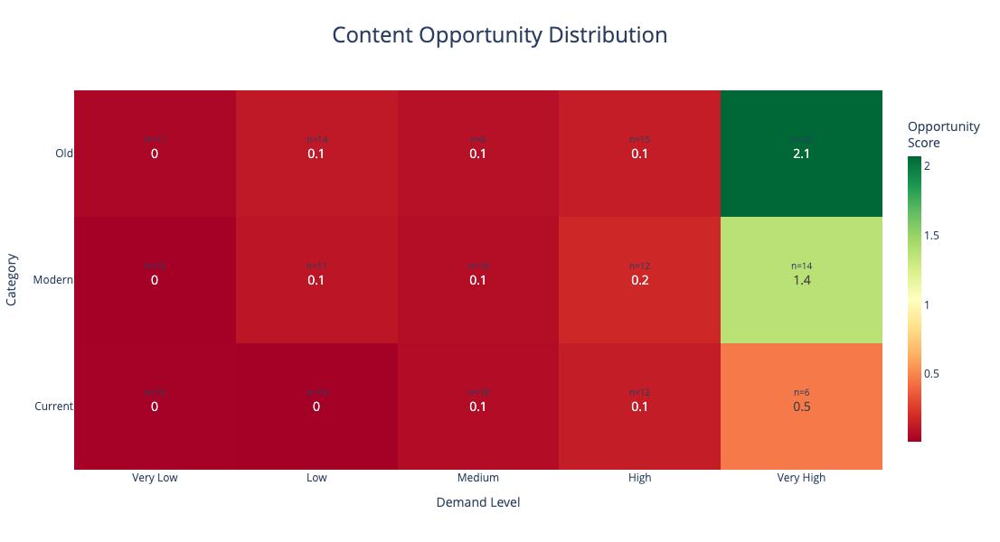

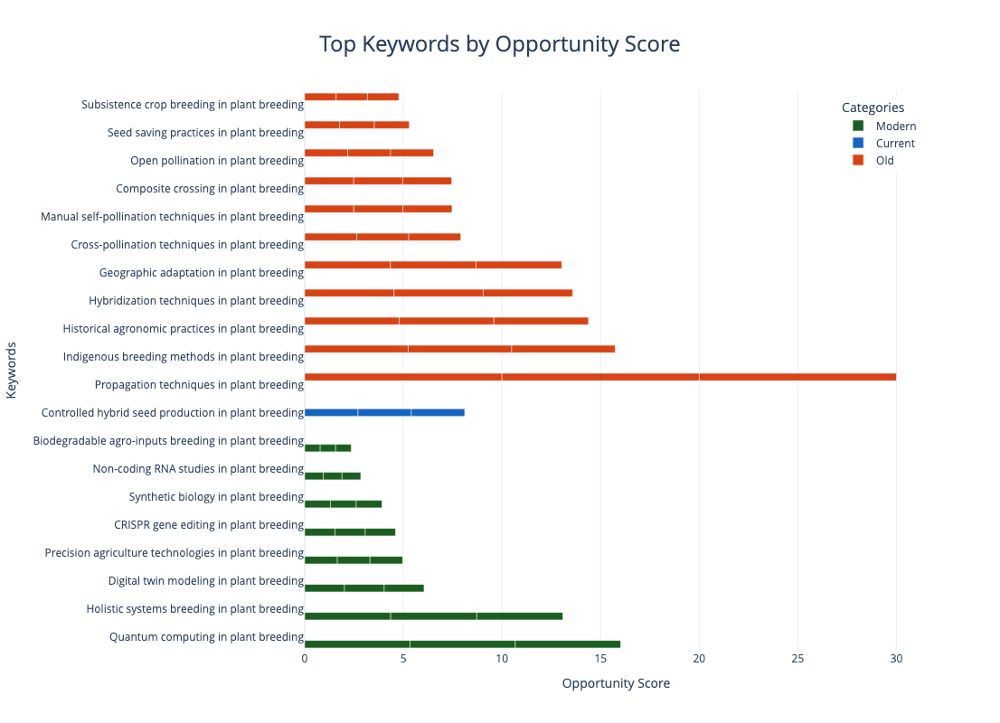


Strategy Insights as per demand and opportunity scores:

Top 10 Keywords - Modern Category:
----------------------------------------
Quantum computing in plant breeding:
  Opportunity Score: 5.3/10
  Demand Score: 4.8/10
  Total Views: 131,562,390
  Interaction Rate: 0.0348
  Engagement Per Video: 91443.7

Holistic systems breeding in plant breeding:
  Opportunity Score: 4.4/10
  Demand Score: 4.3/10
  Total Views: 113,955,675
  Interaction Rate: 0.0316
  Engagement Per Video: 72061.7

Digital twin modeling in plant breeding:
  Opportunity Score: 2.0/10
  Demand Score: 3.8/10
  Total Views: 46,402,958
  Interaction Rate: 0.0387
  Engagement Per Video: 35889.7

Precision agriculture technologies in plant breeding:
  Opportunity Score: 1.7/10
  Demand Score: 1.9/10
  Total Views: 74,228,025
  Interaction Rate: 0.0098
  Engagement Per Video: 14548.8

CRISPR gene editing in plant breeding:
  Opportunity Score: 1.5/10
  Demand Score: 3.7/10
  Total Views: 35,236,304
  Interaction Rate: 0.0

In [36]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import numpy as np

def calculate_metrics(df):
    """Calculate opportunity and demand metrics"""
    # Group by keyword and category
    metrics = df.groupby(['keyword', 'category']).agg({
        'view_count': ['sum', 'mean'],
        'like_count': 'sum',
        'comment_count': 'sum',
        'video_id': 'count'
    }).reset_index()
    
    # Column names
    metrics.columns = ['keyword', 'category', 'total_views', 'avg_views', 'total_likes', 
                      'total_comments', 'video_count']
    
    # Calculate new metrics
    metrics['interaction_rate'] = (metrics['total_likes'] + metrics['total_comments']) / metrics['total_views']
    metrics['engagement_per_video'] = (metrics['total_likes'] + metrics['total_comments']) / metrics['video_count']
    metrics['normalized_views'] = metrics['total_views'] / metrics['total_views'].max()
    
    # Calculate updated opportunity score
    # Weights: α=0.5 for normalized views, β=0.5 for engagement per video
    metrics['opportunity_score'] = (
        0.5 * metrics['normalized_views'] +
        0.5 * (metrics['engagement_per_video'] / metrics['engagement_per_video'].max())
    ) * 10
    
    # Calculate demand score based on new metrics
    metrics['demand_score'] = (
        0.5 * metrics['normalized_views'] +
        0.5 * (metrics['interaction_rate'] / metrics['interaction_rate'].max())
    ) * 10
    
    return metrics

def create_opportunity_heatmap(metrics):
    """Create enhanced opportunity heatmap"""
    # Create demand level bins
    metrics['demand_level'] = pd.qcut(
        metrics['demand_score'], 
        q=5, 
        labels=['Very Low', 'Low', 'Medium', 'High', 'Very High']
    )
    
    # Create pivot tables
    heatmap_data = metrics.pivot_table(
        index='category',
        columns='demand_level',
        values='opportunity_score',
        aggfunc='mean',
        observed=False 
    )
    
    keyword_counts = metrics.pivot_table(
        index='category',
        columns='demand_level',
        values='keyword',
        aggfunc='count',
        observed=False  
    )
    
    # Create hover text
    hover_text = np.array([
        [f"Category: {cat}<br>" +
         f"Demand Level: {level}<br>" +
         f"Opportunity Score: {score:.1f}<br>" +
         f"Keywords: {count}"
         for level, score, count in zip(heatmap_data.columns, row, counts)]
        for cat, row, counts in zip(heatmap_data.index, heatmap_data.values, keyword_counts.values)
    ])
    
    # Create heatmap
    fig = go.Figure(go.Heatmap(
        z=heatmap_data.values,
        x=heatmap_data.columns,
        y=heatmap_data.index,
        colorscale='RdYlGn',
        text=np.round(heatmap_data.values, 1),
        texttemplate='%{text}',
        textfont={"size": 14},
        colorbar=dict(
            title="Opportunity<br>Score",
            thickness=15,
            len=0.9
        ),
        hovertemplate="%{customdata}<extra></extra>",
        customdata=hover_text
    ))
    
    # Update layout
    fig.update_layout(
        title={
            'text': 'Content Opportunity Distribution',
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {'size': 24}
        },
        xaxis_title="Demand Level",
        yaxis_title="Category",
        height=600,
        width=1200,
        template='plotly_white'
    )
    
    # Add keyword count annotations
    for i in range(len(heatmap_data.index)):
        for j in range(len(heatmap_data.columns)):
            fig.add_annotation(
                text=f"n={int(keyword_counts.values[i][j])}",
                x=j,
                y=i,
                xref="x",
                yref="y",
                showarrow=False,
                font=dict(size=10),
                yshift=15
            )
    
    return fig

def create_top_keywords_chart(metrics):
    """Create horizontal bar chart of top keywords"""
    colors = {
        'Modern': '#1B5E20',
        'Current': '#1565C0',
        'Old': '#D84315'
    }
    
    # Get top keywords for each category
    top_keywords = []
    for category in colors:
        cat_top = metrics.nlargest(20, 'opportunity_score')
        cat_top['color'] = colors[category]
        top_keywords.append(cat_top)
    
    top_df = pd.concat(top_keywords)
    
    fig = go.Figure()
    
    for category in colors:
        cat_data = top_df[top_df['category'] == category]
        
        fig.add_trace(go.Bar(
            y=cat_data['keyword'],
            x=cat_data['opportunity_score'],
            name=category,
            orientation='h',
            marker_color=colors[category],
            hovertemplate=(
                "<b>%{y}</b><br>" +
                "Opportunity Score: %{x:.1f}/10<br>" +
                "Total Views: %{customdata[0]:,.0f}<br>" +
                "Interaction Rate: %{customdata[1]:.4f}<br>" +
                "Demand Score: %{customdata[2]:.1f}/10<br>" +
                "<extra></extra>"
            ),
            customdata=np.column_stack((
                cat_data['total_views'],
                cat_data['interaction_rate'],
                cat_data['demand_score']
            ))
        ))
    
    fig.update_layout(
        title={
            'text': 'Top Keywords by Opportunity Score',
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {'size': 24}
        },
        xaxis_title="Opportunity Score",
        yaxis_title="Keywords",
        height=800,
        width=1200,
        barmode='group',
        showlegend=True,
        legend=dict(
            title="Categories",
            yanchor="top",
            y=0.99,
            xanchor="right",
            x=0.99
        ),
        template='plotly_white'
    )
    
    return fig

# Calculate metrics with new approach
metrics = calculate_metrics(df)

# Create and display visualizations
heatmap_fig = create_opportunity_heatmap(metrics)
top_keywords_fig = create_top_keywords_chart(metrics)

# Display visualizations
heatmap_fig.show()
top_keywords_fig.show()

# Print detailed insights with additional metrics
print("\nStrategy Insights as per demand and opportunity scores:")
print("=" * 80)

# Print top 10 keywords for each category with new metrics
for category in ['Modern', 'Current', 'Old']:
    print(f"\nTop 10 Keywords - {category} Category:")
    print("-" * 40)
    top_10 = metrics[metrics['category'] == category].nlargest(10, 'opportunity_score')
    for idx, row in top_10.iterrows():
        print(f"{row['keyword']}:")
        print(f"  Opportunity Score: {row['opportunity_score']:.1f}/10")
        print(f"  Demand Score: {row['demand_score']:.1f}/10")
        print(f"  Total Views: {row['total_views']:,.0f}")
        print(f"  Interaction Rate: {row['interaction_rate']:.4f}")
        print(f"  Engagement Per Video: {row['engagement_per_video']:.1f}")
        print()

# Category analysis with new metrics
for category in ['Modern', 'Current', 'Old']:
    cat_data = metrics[metrics['category'] == category]
    
    print(f"\n{category} Category Analysis:")
    print("-" * 40)
    print(f"Total Keywords: {len(cat_data)}")
    print(f"Average Opportunity Score: {cat_data['opportunity_score'].mean():.2f}/10")
    print(f"Average Demand Score: {cat_data['demand_score'].mean():.2f}/10")
    print(f"Average Interaction Rate: {cat_data['interaction_rate'].mean():.4f}")
    print(f"Average Engagement Per Video: {cat_data['engagement_per_video'].mean():.1f}")

# Overall market insights with new metrics
print("\nOverall Market Insights:")
print("=" * 80)
print(f"Total Keywords Analyzed: {len(metrics)}")
print(f"Average Opportunity Score: {metrics['opportunity_score'].mean():.2f}/10")
print(f"Average Demand Score: {metrics['demand_score'].mean():.2f}/10")
print(f"Average Interaction Rate: {metrics['interaction_rate'].mean():.4f}")
print(f"Average Engagement Per Video: {metrics['engagement_per_video'].mean():.1f}")

# High potential keywords using new metrics
high_potential = metrics[
    (metrics['demand_score'] > metrics['demand_score'].median()) &
    (metrics['opportunity_score'] > metrics['opportunity_score'].median()) &
    (metrics['interaction_rate'] > metrics['interaction_rate'].median())
]
print(f"\nHigh Potential Keywords: {len(high_potential)} found")
print("\nTop 5 Overall Opportunities:")
top_5_overall = high_potential.nlargest(5, 'opportunity_score')
for _, row in top_5_overall.iterrows():
    print(f"\n{row['keyword']} ({row['category']}):")
    print(f"  Opportunity Score: {row['opportunity_score']:.1f}/10")
    print(f"  Demand Score: {row['demand_score']:.1f}/10")
    print(f"  Interaction Rate: {row['interaction_rate']:.4f}")
    print(f"  Engagement Per Video: {row['engagement_per_video']:.1f}")